# Coding Project - Watermark

Write code to automatically add a watermark to a photograph.

<img src='./ex_wm.jpg' width="500px" />

## Main requirements

The minimum requirements are to:
* Add the white pixels from the watermark somewhere in the photograph.
* Save the resulting image as an image file & display it in the notebook

You may use the *watermark.png* file available in the GitHub repository, or choose/create your own.

## Additional requirements

For extra points, you may add some possible improvements (note: this is not an exhaustive list, use your imagination!)

* Add an option to choose the watermark location
* Add transparency effect to the watermark
* Determine if the watermark should be dark or light based on the luminosity of the image
* ...



<Figure size 432x288 with 0 Axes>

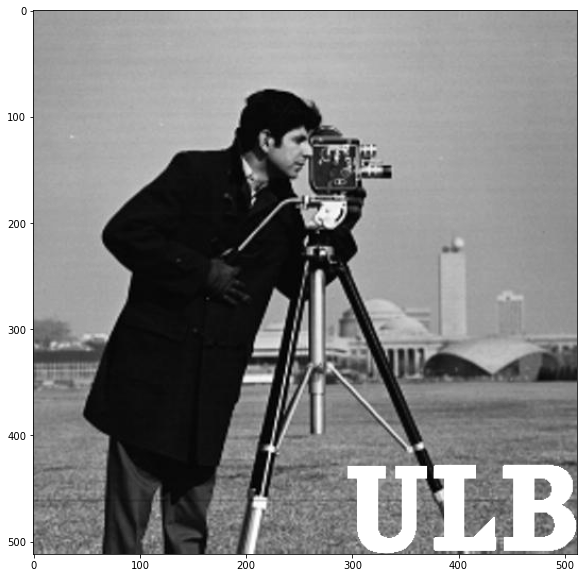

In [1]:
#v1
#juste png sans transparence ni choix de position ni création d'image

from skimage.io import imread,imsave,imshow
import numpy as np
%matplotlib inline 
from matplotlib import pyplot as plt


#need to add choice of location
#add transparancy
#resize wm based on the image size
#see if it can be optimized
#try creating the wm by writing it on the image
#change of police
def apply_watermak(im, wm):
    for i in range(wm.shape[0]):
        for j in range(wm.shape[1]):
            if(wm[i,j]>0):
                im[(im.shape[0]-wm.shape[0])+i, (im.shape[1]-wm.shape[1])+j] = 255
    return im

im_watermark = imread('watermark.png')
im = imread('camera.jpg')
im2 = imread('ex_wm.jpg')
#im3 = imread('TrainWindowMotionBNWUsineCow.JPG')

im = apply_watermak(im, im_watermark)

plt.gray()
plt.figure(figsize=(15,10))
plt.imshow(im)
plt.show()

<Figure size 432x288 with 0 Axes>

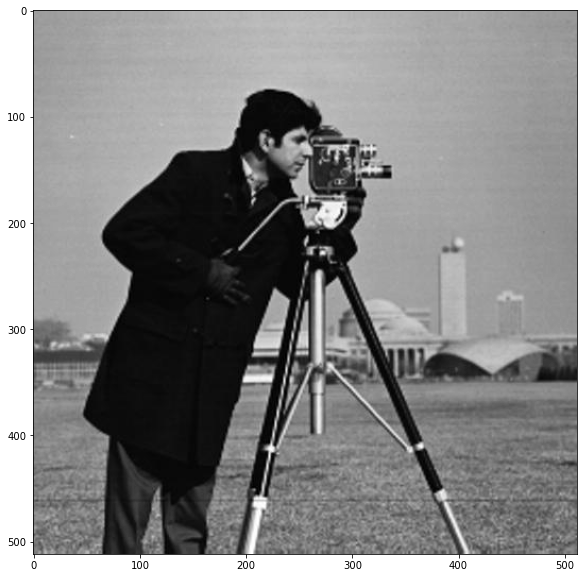

In [2]:
#v2
#juste png sans transparence v1 ni choix de position
#creation de wm mais encore problème de taille
#!!taille d'écriture en fnct de font, taille de wm en fct de font et len(t)!!

from skimage.io import imread,imsave,imshow
import numpy as np
%matplotlib inline 
from matplotlib import pyplot as plt
from PIL import Image, ImageDraw, ImageFont
#see for info : https://pillow.readthedocs.io/en/stable/reference/Image.html

#/System/Library/Fonts/Supplemental pour trouver les fonts
f_arial = ImageFont.truetype('/System/Library/Fonts/Supplemental/Arial.ttf', 70)
f_times_new_roman = ImageFont.truetype('/System/Library/Fonts/Supplemental/Times New Roman.ttf', 70)

#Take for arguments:  the wanted text, its size, its font and its color 
def create_im_watermak(t, s, f, c):
    i = Image.new('L', s)
    d = ImageDraw.Draw(i)
    d.text((1, 1), t, font=f, fill=255)
    i.save('{}.jpg'.format(t)) #mettre en dehors?
    i = imread('{}.jpg'.format(t)) #idem
    return i 


def apply_watermak(im, wm):
    for i in range(wm.shape[0]):
        for j in range(wm.shape[1]):
            if(wm[i,j]>215): #215 for noise
                im[(im.shape[0]-wm.shape[0])+i, (im.shape[1]-wm.shape[1])+j] = 255
    return im

im = imread('camera.jpg')

plt.gray()
#im_watermark = create_im_watermak('Arthur', (219, 85), f_arial, (255, 255, 255))
#im = apply_watermak(im, im_watermark)
plt.figure(figsize=(15,10))
plt.imshow(im)
plt.show()

uint8


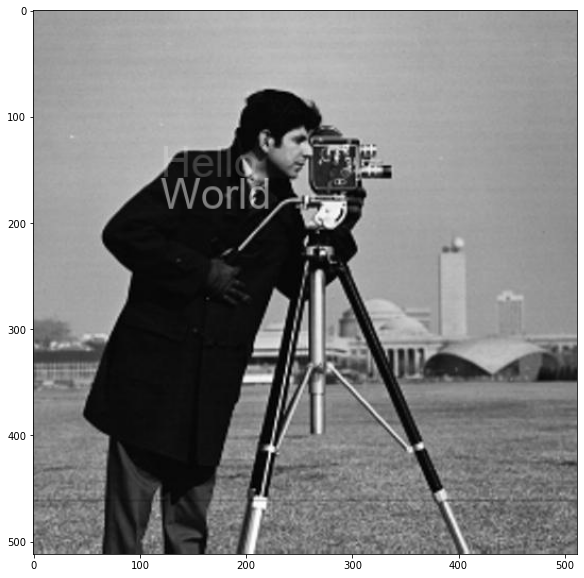

In [3]:
#Tests transparance
from PIL import Image, ImageDraw, ImageFont

# get an image
base = Image.open("camera.jpg").convert("RGBA")
print(np.array(base).dtype)

# make a blank image for the text, initialized to transparent text color
txt = Image.new("RGBA", base.size, (255,255,255,0))

# get a font
fnt = ImageFont.truetype('/System/Library/Fonts/Supplemental/Arial.ttf', 40)
# get a drawing context
d = ImageDraw.Draw(txt)

# draw text, half opacity
d.text((120,120), "Hello", font=fnt, fill=(255,255,255,50))
# draw text, full opacity
d.text((120,150), "World", font=fnt, fill=(255,255,255,120))
#print(np.array(txt)[150:170, 120:130])
out = Image.alpha_composite(base, txt)

plt.figure(figsize=(15,10))
plt.imshow(out)
plt.show()

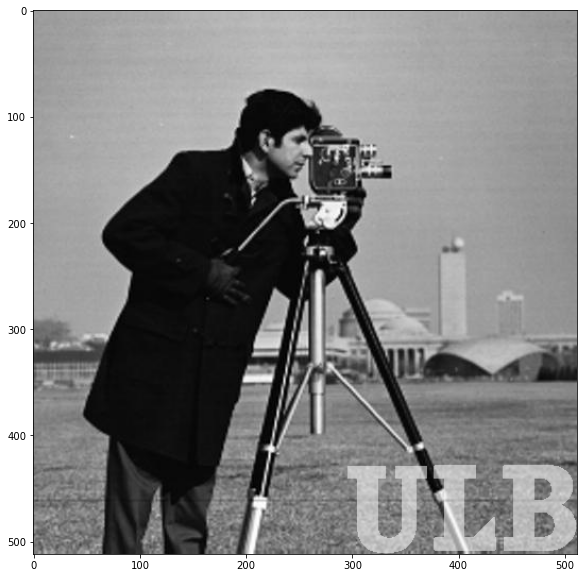

In [4]:
#v3
#juste png transparant sans choix de position
#creation de wm mais encore problème de taille
#!!taille d'écriture en fnct de font, taille de wm en fct de font et len(t)!!
#try not to save wm np.array(wm)
#attention fonts sur ordi

from skimage.io import imread,imsave,imshow
import numpy as np
%matplotlib inline 
from matplotlib import pyplot as plt
from PIL import Image, ImageDraw, ImageFont
#see for info : https://pillow.readthedocs.io/en/stable/reference/Image.html

#/System/Library/Fonts/Supplemental pour trouver les fonts
f_arial = ImageFont.truetype('/System/Library/Fonts/Supplemental/Arial.ttf', 70)
f_times_new_roman = ImageFont.truetype('/System/Library/Fonts/Supplemental/Times New Roman.ttf', 70)

#Take for arguments:  the wanted text, its size and its font
#try to cut the 2 last commmand by modifying the apply_watermark fnct
def create_im_watermak(t, s, f):
    i = Image.new("RGBA", s, (0,0,0,255))
    d = ImageDraw.Draw(i)
    d.text((0, 0), t, font=f, fill=(255,255,255,255))
    i.save('{}.png'.format(t)) #mettre en dehors?
    i = imread('{}.png'.format(t)) #idem
    return i 

#Pour wm transfo en RGBA pour que ce soit bon quelque soit le format
#try np.array(wm) not saved
#take for arguments: skiimage-image RGBA, skiimage-watermark RGBA, transparancy
def apply_watermak(im, wm, trns):
    for i in range(wm.shape[0]):
        for j in range(wm.shape[1]):
            if(wm[i,j][0]>215): #215 for noise
                im[(im.shape[0]-wm.shape[0])+i, (im.shape[1]-wm.shape[1])+j][3] = trns
    return im


"""wm BW pas RGB, ni RGBA
def apply_watermak(im, wm, trns):
    for i in range(wm.shape[0]):
        for j in range(wm.shape[1]):
            if(wm[i,j]>215): #215 for noise
                im[(im.shape[0]-wm.shape[0])+i, (im.shape[1]-wm.shape[1])+j][3] = trns
    return im
"""

#Take an image and transform it to RGBA
def to_rgba(im):
    if (np.array(im).ndim == 2):
        transparency = np.ones(im.shape)*255
        im_rgba = np.stack((im, im, im, transparency), axis=2).astype('uint8')
    elif (np.array(im).ndim == 3 and np.array(im).shape[2] == 3):
        r = im[:, :, 0]
        g = im[:, :, 1]
        b = im[:, :, 2]
        transparency = np.ones(r.shape)*255
        im_rgba = np.stack((r, g, b, transparency), axis=2).astype('uint8')
    else:
        im_rgba = im
    return im_rgba
    
im = imread('camera.jpg')
#wm = create_im_watermak('Arthur', (200, 100), f_arial)
wm = imread('watermark.png')
wm_rgba = to_rgba(wm)
im_rgba = to_rgba(im)
im_f = apply_watermak(im_rgba, wm_rgba, 120)

plt.figure(figsize=(15, 10))
plt.imshow(im_f)
plt.show()

In [5]:
#Tests array

a = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])
b = np.array([[11, 12, 13], [14, 15, 16], [17, 18, 19]])
c = np.array([[21, 22, 23], [24, 25, 26], [27, 28, 29]])
s = np.ones(a.shape)
x = np.stack((a, b, c), axis=2)
r = x[:,:,0]
g = x[:,:,1]
B = x[:,:,2]
y = np.stack((r, g, B), axis=2).astype('uint8')
print(y)
print(np.stack((a, b, c, s), axis=2).astype('uint8'))

[[[ 1 11 21]
  [ 2 12 22]
  [ 3 13 23]]

 [[ 4 14 24]
  [ 5 15 25]
  [ 6 16 26]]

 [[ 7 17 27]
  [ 8 18 28]
  [ 9 19 29]]]
[[[ 1 11 21  1]
  [ 2 12 22  1]
  [ 3 13 23  1]]

 [[ 4 14 24  1]
  [ 5 15 25  1]
  [ 6 16 26  1]]

 [[ 7 17 27  1]
  [ 8 18 28  1]
  [ 9 19 29  1]]]


(139, 46)
209 65


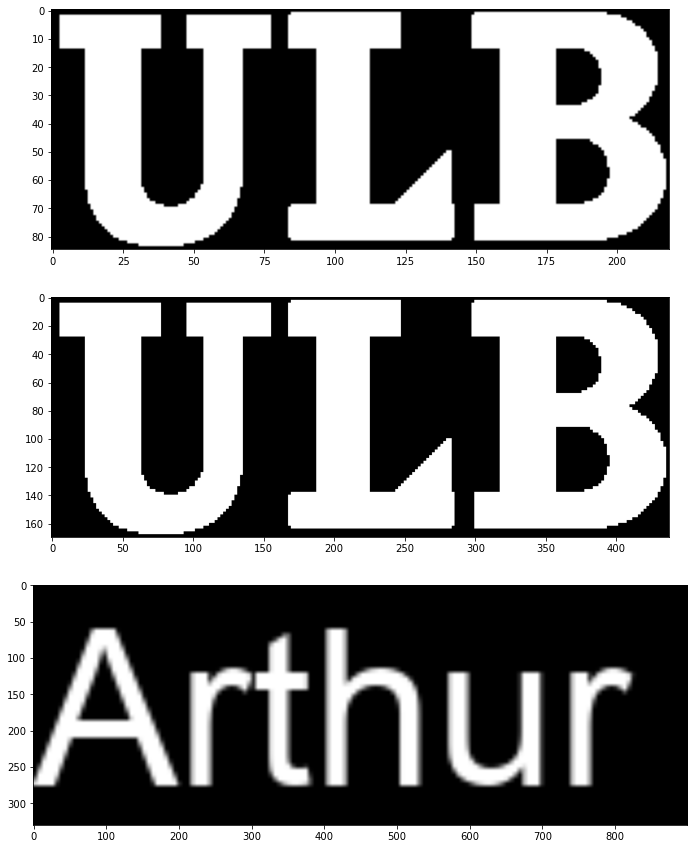

In [6]:
#tests taille

def create_im_watermak(t, s, f):
    i = Image.new("RGBA", s, (0,0,0,255))
    d = ImageDraw.Draw(i)
    d.text((0, 0), t, font=f, fill=(255,255,255,255))
    #i.save('{}.png'.format(t)) #mettre en dehors?
    #i = imread('{}.png'.format(t)) #idem
    return i 

fnt = ImageFont.truetype('/System/Library/Fonts/Supplemental/Bradley Hand Bold.ttf', 50)
fnt1 = ImageFont.truetype('/System/Library/Fonts/Supplemental/Bradley Hand Bold.ttf', 70)
fnt2 = ImageFont.truetype('/Library/Arial.ttf', 50)
fnt3 = ImageFont.truetype('/System/Library/Fonts/Supplemental/Arial.ttf', 70)

#
img = Image.new('RGB', (150, 55))
d = ImageDraw.Draw(img)
d.text((0,0), "Arthur", font=fnt2, fill=(255, 255, 255))

t = d.textsize("Arthur", fnt2)
print(t)
resize = img.resize((900, 330), Image.NEAREST) #fav
resize2 = img.resize((900, 330), Image.BILINEAR)
#

#
im_for_text_size = Image.new('RGBA', (1, 1), (0,0,0,255))
text = ImageDraw.Draw(im_for_text_size)
text_size = text.textsize("Le text", fnt3)
#text_size = (0, 0)
print(text_size[0], text_size[1])
#

#
wm = Image.open('watermark.png')
wm_resize = wm.resize((wm.size[0]*2,wm.size[1]*2))
#

#
#test = create_im_watermak("H", (60,100), fnt3)
#t = d.textsize("H", fnt)
#print(t)
#resize = test.resize((200, 200))
#

plt.figure(figsize=(20, 15))
plt.subplot(3, 1, 1)
plt.imshow(wm)
plt.subplot(3, 1, 2)
plt.imshow(wm_resize)
plt.subplot(3, 1, 3)
plt.imshow(resize2)
plt.show()

1) Ouvrir image sur laquelle appliquer la watermark + la wm si pas de création

2) Créer la wm de la taille de l'écriture (get_size_txt() + create_watermark())

3) apply_watermark(to_rgba(im), to_rgba(wm), trns, p) -->p soit coordonnées soit str ("la", "lm", "ld", "ma", "mm", "md", "ra", "rm", "rd"); resize wm en fct im.shape

4) Display

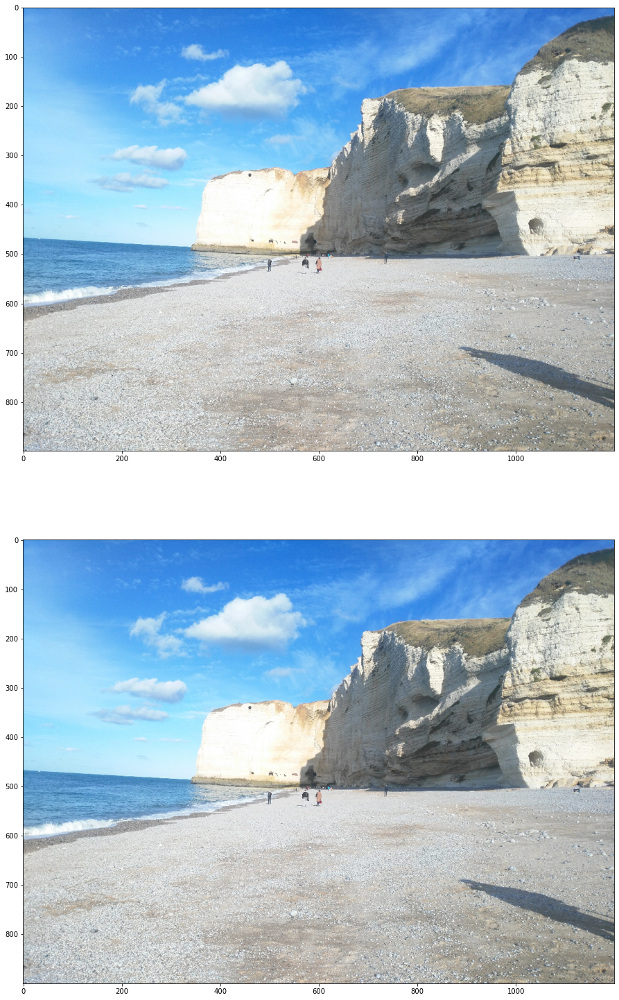

In [5]:
#v4_rgb
#wm transparant avec choix de position
#creation de wm avec 4 fonts - petit ajustement pour les positions '.a' en fnct des fonts
#fonts avec notebook dans le même répertoire
#determiner effet de la luminosite cf pb: im_f1 = apply_watermak(to_rgba(im), to_rgba(wm1), (110, 200), 120)
#essayer transparance noire

from skimage.io import imread,imsave,imshow
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image, ImageDraw, ImageFont
%matplotlib inline 

#Take a text and a font to evaluate the size needed for the containing wm
def size_of_text(t, f):
    im_for_text_size = Image.new('L', (1, 1))
    d = ImageDraw.Draw(im_for_text_size)
    return d.textsize("{}".format(t), f)

#Take for arguments:  the wanted text, its font and if the user want to save it
#Create a wm from scratch with a wanted text
def create_im_watermak(t, f, save = None):
    s = size_of_text(t, f)
    i = Image.new("L", (s[0], s[1]))
    d = ImageDraw.Draw(i)
    d.text((0, 0), t, font=f, fill=255)
    if save:
        i.save('{}.png'.format(t))
    return i 

#Take an image and transform it to RGB
def to_rgb(im):
    if (np.array(im).ndim == 2):
        im_rgb = np.stack((im, im, im), axis=2).astype('uint8')
    else:
        im_rgb = im
    return im_rgb

#Take the image and the watermark and resize the watermark according to the image dimensions
def resize_watermark(im, wm):
    if (type(wm) != Image.Image):
        wm = Image.fromarray(wm)
    if (im.shape[0] <= im.shape[1]):
        wm = wm.resize((np.array(wm).shape[1]*im.shape[0]//(10*np.array(wm).shape[0]), im.shape[0]//10), Image.NEAREST)
    else:
        wm = wm.resize((im.shape[1]//5, np.array(wm).shape[0]*im.shape[1]//(5*np.array(wm).shape[1])), Image.NEAREST)
    return  np.array(wm)

#Take the image, the watermark and the wanted position either with one of the 10 predetermined positions 
#or with a tuple/liste
def convert_to_coordinates(im, wm, p):
    if (type(p) != str):
        pos = p
    elif (p == 'la'):
        pos = (5, 5)
    elif (p == 'lm'):
        pos = ((im.shape[0]//2)-wm.shape[0]//2, 5)
    elif (p == 'ld'):
        pos = ((im.shape[0]-wm.shape[0]-5), 5)
    elif (p == 'ma'):
        pos = (5, (im.shape[1]//2)-wm.shape[1]//2)
    elif (p == 'mm'):
        pos = ((im.shape[0]//2)-wm.shape[0]//2, (im.shape[1]//2)-wm.shape[1]//2)
    elif (p == 'md'):
        pos = ((im.shape[0]-wm.shape[0]-5), (im.shape[1]//2)-wm.shape[1]//2)
    elif (p == 'ra'):
        pos = (5, (im.shape[1]-wm.shape[1])-5)
    elif (p == 'rm'):
        pos = ((im.shape[0]//2)-wm.shape[0]//2, (im.shape[1]-wm.shape[1])-5)
    elif (p == 'rd'):
        pos = ((im.shape[0]-wm.shape[0])-5, (im.shape[1]-wm.shape[1])-5)
    return pos

#Take for arguments: image RGB, watermark, position for the wm and if the user want to save the result
#Apply the watermark to the image at the given position
def transform_image_rgb_method(im, wm, pos, trns):
    wm  = resize_watermark(im, wm)
    p = convert_to_coordinates(im, wm, pos)
    for i in range(wm.shape[0]):
        for j in range(wm.shape[1]):
            if(wm[i,j]>0): #215 for noise
                for k in range(3):
                    if (im[p[0]+i, p[1]+j][k] - trns < 0):
                        im[p[0]+i, p[1]+j][k] = 0
                    else:
                        im[p[0]+i, p[1]+j][k] -= trns
    return im

def apply_watermark_rgb_method(im, wm, pos, file_name=None):
    im = transform_image(im, wm, pos, 70)
    if file_name:
        imsave('{}.png'.format(file_name), im)
    return im

def remove_watermark_rgb_method(im, wm, pos, file_name=None):
    im = transform_image(im, wm, pos, -70)
    if file_name:
        imsave('{}.png'.format(file_name), im)
    return im

#fnt = ImageFont.truetype('/System/Library/Fonts/Supplemental/Arial.ttf', 300) path for font for Mac users
#a sample of 4 font has been implemented with the notebook
fnt = ImageFont.truetype('Arial.ttf', 300)
fnt1 = ImageFont.truetype('Papyrus.ttc', 300)
fnt2 = ImageFont.truetype('Phosphate.ttc', 300)
fnt3 = ImageFont.truetype('Times New Roman.ttf', 300)

im = imread('camera.jpg')
im2 = imread('ex_wm.jpg')
im3 = imread('walking.jpg')
im4 = imread('etretat.jpg')
#im5 = imread('TrainWindowMotionBNWUsineCow.JPG')
wm = create_im_watermak("Arthur", fnt3, False)
wm1 = create_im_watermak("ULB", fnt3, False)
#wm = imread('watermark.png')
im_f = apply_watermark(to_rgb(im4), wm, "mm", "AAA")
im_f1 = remove_watermark(to_rgb(im4), wm, "mm", "AAB")


plt.figure(figsize=(40, 40))
plt.subplot(3, 1, 1)
plt.imshow(im_f)
plt.subplot(3, 1, 2)
plt.imshow(im_f1)
#plt.subplot(3, 1, 3)
#plt.imshow(imtest)
plt.show()

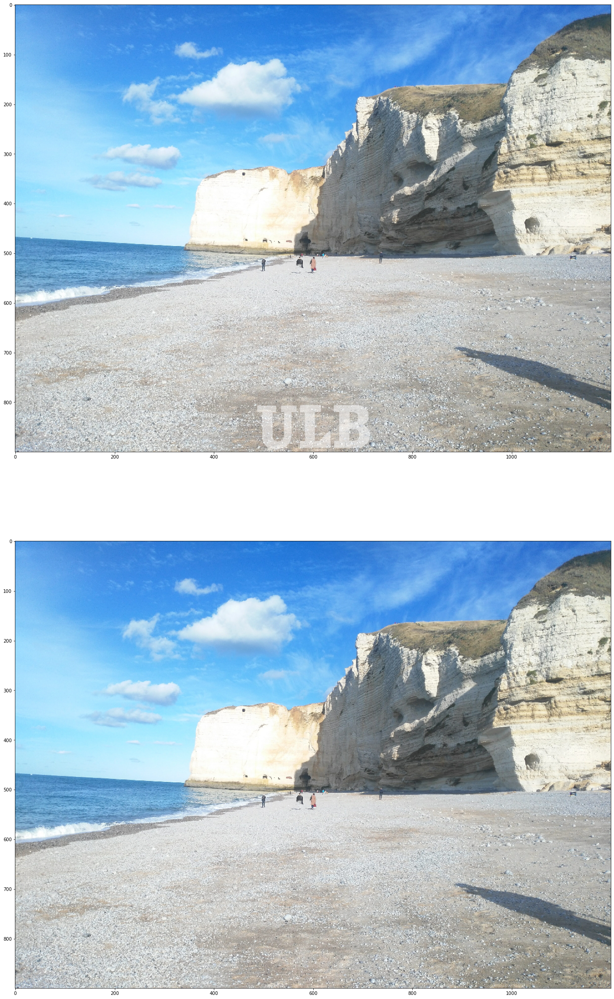

In [7]:
#v4_rgba
#wm transparant avec choix de position
#creation de wm avec 4 fonts - petit ajustement pour les positions '.a' en fnct des fonts
#fonts avec notebook dans le même répertoire
#determiner effet de la luminosite cf pb: im_f1 = apply_watermak(to_rgba(im), to_rgba(wm1), (110, 200), 120)

from skimage.io import imread,imsave,imshow
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image, ImageDraw, ImageFont
%matplotlib inline 

#Take a text and a font to evaluate the size needed for the containing wm
def size_of_text(t, f):
    im_for_text_size = Image.new('RGBA', (1, 1), (0,0,0,255))
    d = ImageDraw.Draw(im_for_text_size)
    return d.textsize("{}".format(t), f)

#Take for arguments:  the wanted text, its font and if the user want to save it
#Create a wm from scratch with a wanted text
def create_im_watermak(t, f, save = None):
    s = size_of_text(t, f)
    i = Image.new("RGBA", (s[0], s[1]), (0,0,0,255))
    d = ImageDraw.Draw(i)
    d.text((0, 0), t, font=f, fill=(255,255,255,255))
    if save:
        i.save('{}.png'.format(t))
    return i 

#Take an image and transform it to RGBA
def to_rgba(im):
    if (np.array(im).ndim == 2):
        transparency = np.ones(im.shape)*255
        im_rgba = np.stack((im, im, im, transparency), axis=2).astype('uint8')
    elif (np.array(im).ndim == 3 and np.array(im).shape[2] == 3):
        r = im[:, :, 0]
        g = im[:, :, 1]
        b = im[:, :, 2]
        transparency = np.ones(r.shape)*255
        im_rgba = np.stack((r, g, b, transparency), axis=2).astype('uint8')
    else:
        im_rgba = im
    return im_rgba

#Take the image and the watermark and resize the watermark according to the image dimensions
def resize_watermark(im, wm):
    if (type(wm) != Image.Image):
        wm = Image.fromarray(wm)
    if (im.shape[0] <= im.shape[1]):
        wm = wm.resize((np.array(wm).shape[1]*im.shape[0]//(10*np.array(wm).shape[0]), im.shape[0]//10), Image.NEAREST)
    else:
        wm = wm.resize((im.shape[1]//5, np.array(wm).shape[0]*im.shape[1]//(5*np.array(wm).shape[1])), Image.NEAREST)
    return  np.array(wm)

#Take the image, the watermark and the wanted position either with one of the 10 predetermined positions 
#or with a tuple/liste
def convert_to_coordinates(im, wm, p):
    if (type(p) != str):
        pos = p
    elif (p == 'la'):
        pos = (5, 5)
    elif (p == 'lm'):
        pos = ((im.shape[0]//2)-wm.shape[0]//2, 5)
    elif (p == 'ld'):
        pos = ((im.shape[0]-wm.shape[0]-5), 5)
    elif (p == 'ma'):
        pos = (5, (im.shape[1]//2)-wm.shape[1]//2)
    elif (p == 'mm'):
        pos = ((im.shape[0]//2)-wm.shape[0]//2, (im.shape[1]//2)-wm.shape[1]//2)
    elif (p == 'md'):
        pos = ((im.shape[0]-wm.shape[0]-5), (im.shape[1]//2)-wm.shape[1]//2)
    elif (p == 'ra'):
        pos = (5, (im.shape[1]-wm.shape[1])-5)
    elif (p == 'rm'):
        pos = ((im.shape[0]//2)-wm.shape[0]//2, (im.shape[1]-wm.shape[1])-5)
    elif (p == 'rd'):
        pos = ((im.shape[0]-wm.shape[0])-5, (im.shape[1]-wm.shape[1])-5)
    return pos

#Take for arguments: image RGBA, watermark RGBA, position for the wm and its transparancy
#Transform the image at the given position with the given transparancy
def transform_image(im, wm, pos, trns):
    wm  = resize_watermark(im, wm)
    p = convert_to_coordinates(im, wm, pos)
    for i in range(wm.shape[0]):
        for j in range(wm.shape[1]):
            if(wm[i,j][0]>0):
                im[p[0]+i, p[1]+j][3] = trns
    return im

#Take for arguments: image RGBA, watermark RGBA, position for the wm, its transparancy and the desire to save it or not
#Apply the watermark to the image at the given position with the given transparancy
def apply_watermak(im, wm, pos, trns, file_name = None):
    im = transform_image(im, wm, pos, trns)
    if file_name:
        imsave('{}.png'.format(file_name), im)
    return im

#Take for arguments: image RGBA, watermark RGBA, position for the wm, its transparancy and the desire to save it or not
#Remove the watermark from the image at the given position with the given transparancy
def remove_watermark(im, wm, pos, file_name = None):
    im = transform_image(im, wm, pos, 255)
    if file_name:
        imsave('{}.png'.format(file_name), im)
    return im

#fnt = ImageFont.truetype('/System/Library/Fonts/Supplemental/Arial.ttf', 300) path for font for Mac users
#a sample of 4 font has been implemented with the notebook
fnt = ImageFont.truetype('Arial.ttf', 300)
fnt1 = ImageFont.truetype('Papyrus.ttc', 300)
fnt2 = ImageFont.truetype('Phosphate.ttc', 300)
fnt3 = ImageFont.truetype('Times New Roman.ttf', 300)

im = imread('camera.jpg')
im2 = imread('ex_wm.jpg')
im3 = imread('walking.jpg')
im4 = imread('etretat.jpg')
#im4 = imread('TrainWindowMotionBNWUsineCow.JPG')
#wm = create_im_watermak("Arthur", fnt)
#wm1 = create_im_watermak("Arthur", fnt3)
wm = imread('watermark.png')
im_f = apply_watermak(to_rgba(im4), to_rgba(wm), "md", 120)
im_f1 = remove_watermark(to_rgba(im4), to_rgba(wm), "md")


plt.figure(figsize=(40, 40))
plt.subplot(2, 1, 1)
plt.imshow(im_f)
plt.subplot(2, 1, 2)
plt.imshow(im_f1)
plt.show()